In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scvi
import torch

In [2]:
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [ ]:
sc.settings.figdir = './figures/'  # Create figures folder
sc.settings.set_figure_params(dpi_save=300)

In [3]:
adata = sc.read_h5ad('temp.h5ad')
adata

AnnData object with n_obs × n_vars = 58015 × 14469
    obs: 'samples', 'condition', 'location', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'low_label', 'low_score', '_scvi_batch', '_scvi_labels', 'overcluster'
    var: 'n_cells'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'overcluster', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
adata.obs

,samples,condition,location,n_genes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,low_label,low_score,_scvi_batch,_scvi_labels,overcluster
711_AAACCCAAGTCGGGAT-1,711,Tumor,Right,707,707,6.562444,1396.0,7.242083,26.862464,10.100286,25.716331,0.000000,T follicular helper cells,0.103311,0,0,14
711_AAACCCACAGAGGAAA-1,711,Tumor,Right,838,838,6.732211,1504.0,7.316548,23.803191,9.441490,13.962767,0.000000,Unknown,0.236022,0,0,11
711_AAACCCACATGATAGA-1,711,Tumor,Right,435,435,6.077642,613.0,6.419995,17.781403,0.815661,18.270800,0.000000,Unknown,0.400460,0,0,36
711_AAACCCAGTCTCGCGA-1,711,Tumor,Right,579,579,6.363028,860.0,6.758094,23.255814,15.465117,6.395349,0.000000,Tip-like ECs,0.966648,0,0,28
711_AAACGAAGTTATCTTC-1,711,Tumor,Right,1384,1384,7.233455,2629.0,7.874739,19.246862,8.178015,15.405098,0.000000,gamma delta T cells,0.993837,0,0,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
706_TTTGGTTCAAACACCT-1,706,Tumor,Left,1815,1815,7.504392,4944.0,8.506132,21.318770,1.961974,21.318771,0.020227,CD8+ T cells,0.999997,0,0,1
706_TTTGGTTCAACGGGTA-1,706,Tumor,Left,909,909,6.813445,3528.0,8.168770,34.722222,0.368481,25.368483,0.000000,Pro-inflammatory,0.549964,0,0,12
706_TTTGGTTTCTATCGCC-1,706,Tumor,Left,4658,4658,8.446556,23600.0,10.069044,17.559322,3.237288,18.135593,0.004237,Stromal 2,0.961222,0,0,25
706_TTTGTTGCATCAGCGC-1,706,Tumor,Left,374,374,5.926926,686.0,6.532334,23.032070,10.932944,33.236153,0.000000,CMS2,0.978673,0,0,10


In [5]:
labels = adata.obs[['low_label', 'overcluster']].groupby('overcluster').agg(lambda x: x.mode())
scores = adata.obs[['low_score', 'overcluster']].groupby('overcluster').agg(lambda x: x.mean())

mapping_res = labels.merge(right = scores, left_index=True, right_index=True)
mapping_res[40:50]

,low_label,low_score
overcluster,,
40,IgG+ Plasma,0.825187
41,CD4+ T cells,0.659157
42,CMS3,0.997751
43,cDC,0.815319
44,Unknown,0.928995
45,CD4+ T cells,0.825621
46,Stromal 3,0.957482
47,Enteric glial cells,0.814811
48,Regulatory T cells,0.579990


In [6]:
sc.tl.rank_genes_groups(adata, groupby = 'overcluster')
marks = sc.get.rank_genes_groups_df(adata, group = None)

/home/sapien/anaconda3/envs/scCRC/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/sapien/anaconda3/envs/scCRC/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/sapien/anaconda3/envs/scCRC/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:440: PerformanceWa

In [7]:
marks = marks[(marks.pvals_adj<0.05)& (marks.logfoldchanges>0.5)]
marks

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,IL32,112.418907,2.769070,0.000000,0.000000
1,0,B2M,106.590958,1.144723,0.000000,0.000000
2,0,S100A4,76.388786,2.232210,0.000000,0.000000
3,0,BATF,73.544563,3.609731,0.000000,0.000000
4,0,HLA-A,66.561821,1.126729,0.000000,0.000000
...,...,...,...,...,...,...
694568,48,FOXP3,2.330028,2.522627,0.024683,0.040736
694569,48,CLIC3,2.326259,2.380337,0.024903,0.041090
694570,48,PDE3B,2.311386,1.807260,0.025787,0.042515
694571,48,PRRG3,2.303896,6.288302,0.026245,0.043246


In [29]:
marks[marks.names=='CD4']

,group,names,scores,logfoldchanges,pvals,pvals_adj
108,0,CD4,25.952618,1.642592,1.212907e-137,2.830574e-136
43741,3,CD4,12.879315,0.887221,4.653608e-37,2.483698e-36
87019,6,CD4,9.172139,0.864037,8.851551e-20,3.825361e-19
130525,9,CD4,10.109403,0.782603,1.482943e-23,7.416763e-23
159431,11,CD4,9.348844,0.881652,2.476372e-20,1.265206e-19
173780,12,CD4,23.353777,2.238101,1.542060e-104,2.730975e-103
202664,14,CD4,10.147873,1.187246,1.874478e-23,1.043548e-22
231737,16,CD4,16.654535,1.478679,3.596811e-57,3.690940e-56
246653,17,CD4,11.318451,1.080055,1.731555e-28,7.109499e-28
303992,21,CD4,16.929787,1.744493,2.973262e-57,2.877600e-56


In [13]:
marks[marks.group=='44'].sort_values('logfoldchanges',ascending=False)

,group,names,scores,logfoldchanges,pvals,pvals_adj
636665,44,LILRA4,13.048165,9.446879,2.776574e-22,1.103082e-21
636719,44,SCT,9.213533,8.205291,1.490728e-14,5.099136e-14
636908,44,LAMP5,5.885753,7.997266,7.055969e-08,2.173575e-07
636643,44,IL3RA,18.048576,7.259616,2.501247e-31,1.192440e-30
637099,44,PROC,4.488971,6.904572,2.158797e-05,6.091193e-05
...,...,...,...,...,...,...
637316,44,RPL27A,3.698627,0.513659,3.759110e-04,9.782476e-04
637711,44,PSMB1,2.761924,0.512897,6.988991e-03,1.581788e-02
637943,44,LSM8,2.416738,0.510051,1.771572e-02,3.750786e-02
637818,44,PSME2,2.583567,0.502634,1.142116e-02,2.501935e-02


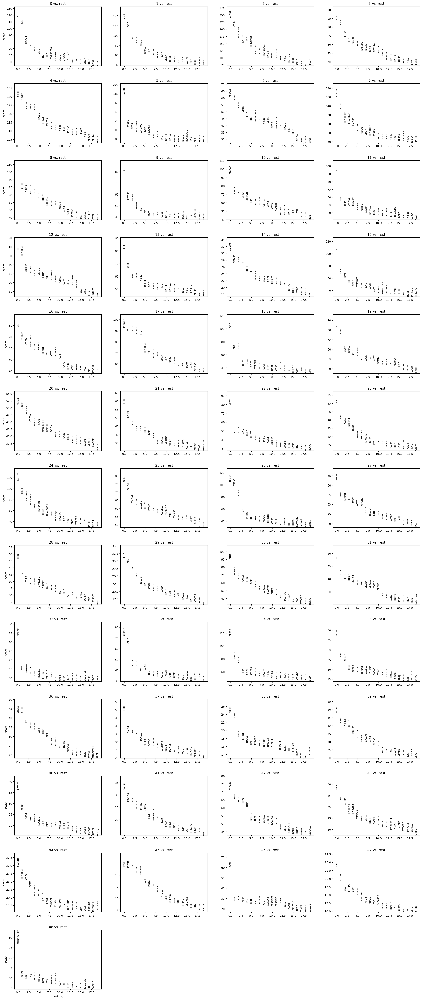

In [26]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)


In [8]:
adata.obs['low_major'] = adata.obs.groupby('overcluster')['low_label'].transform(lambda x: x.mode()[0])

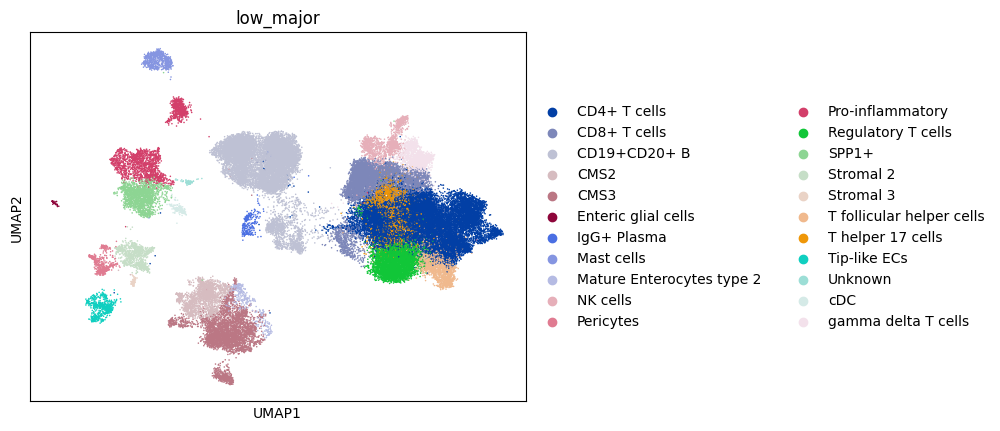

In [9]:
sc.pl.umap(adata, color = ['low_major'], s = 5)


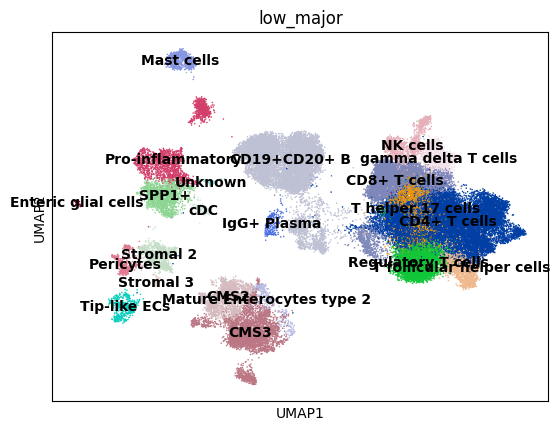

In [10]:
sc.pl.umap(adata, color = ['low_major'], legend_loc = 'on data' ,s = 5)

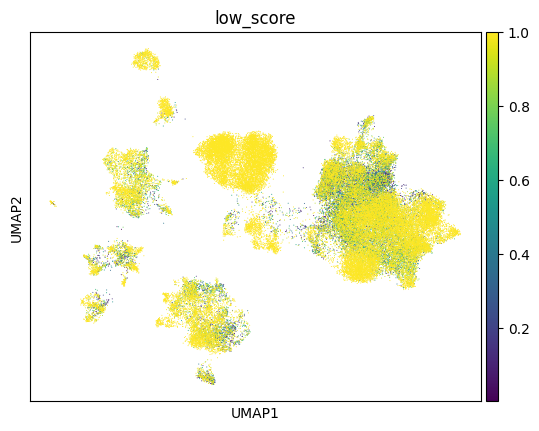

In [11]:
sc.pl.umap(adata, color = ['low_score' ])

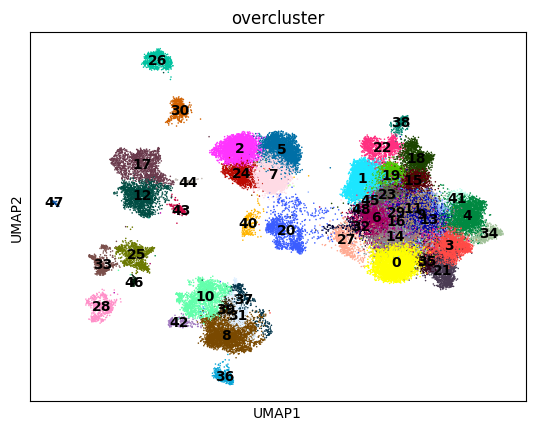

In [12]:
sc.pl.umap(adata, color = ['overcluster'], legend_loc = 'on data', s = 5)

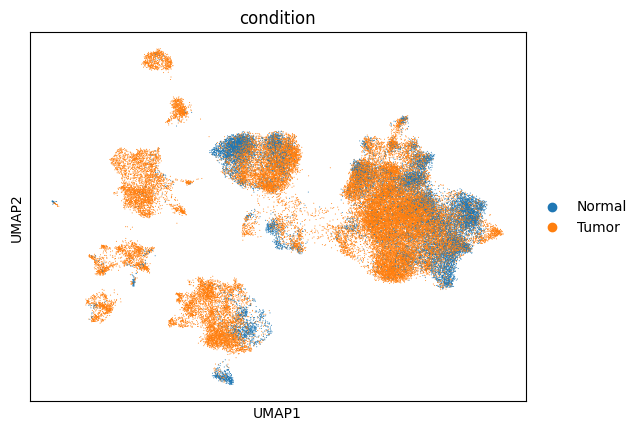

In [13]:
np.random.seed(1)
ri = np.random.permutation(list(range(adata.shape[0])))

sc.pl.umap(adata[ri,:], color = ['condition'], vmin = .5, size = 2)

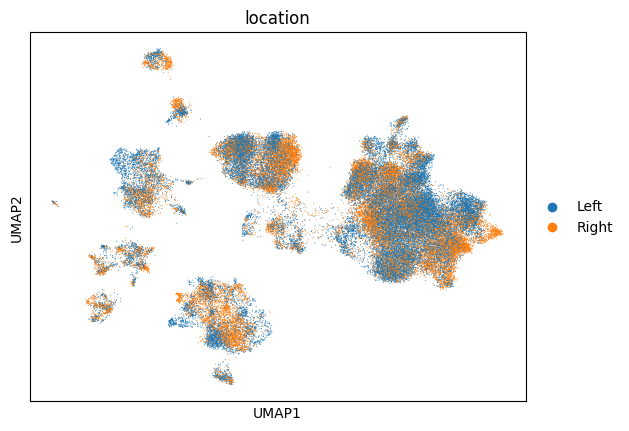

In [14]:
sc.pl.umap(adata[ri,:], color = ['location'], vmin = .5, size = 2)

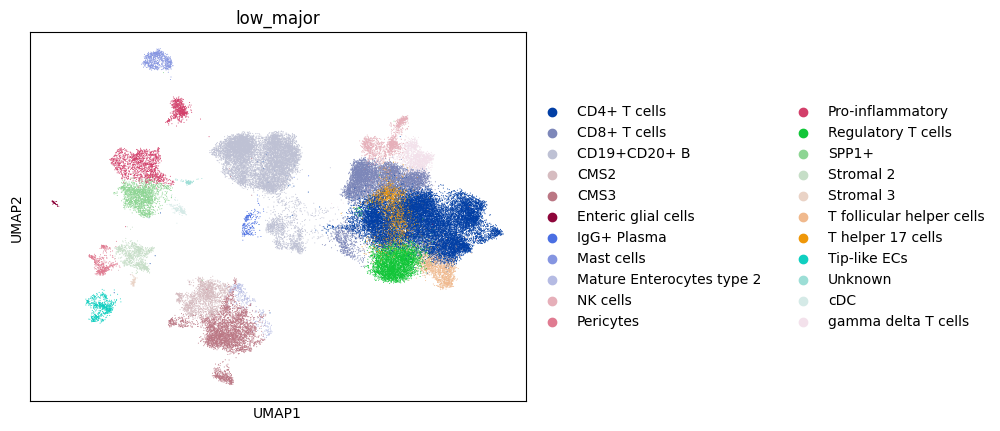

In [15]:
sc.pl.umap(adata[ri,:], color = ['low_major'], vmin = .5, size = 2)

In [10]:
mapping_res

,low_label,low_score
overcluster,,
0,Regulatory T cells,0.928632
1,CD8+ T cells,0.674934
2,CD19+CD20+ B,0.999697
3,CD4+ T cells,0.876088
4,CD4+ T cells,0.956625
5,CD19+CD20+ B,0.998107
6,CD4+ T cells,0.713746
7,CD19+CD20+ B,0.997421
8,CMS3,0.819969


In [20]:
label={"0":"Regulatory T Cells", 
"1":"CD8+ T cells",
"2":"B Cells",
"3":"CD4+ T Cells",
"4":"CD4+ T Cells",
"5":"B Cells", 
"6":"CD4+ T Cells",
"7":"B Cells",
"8":"CMS3",
"9":"CD4+ T Cells",
"10":"CMS2",
"11":"CD4+ T Cells",
"12":"Spp1+",
"13":"CD4+ T Cells",
"14":"CD4+ T Cells", 
"15":"CD8+ T cells",
"16":"Helper 17 T cells",
"17":"Dendritic cells", 
"18":"Gamma delta T cells",
"19":"CD8+ T cells",
"20":"B Cells",
"21":"Follicular helper T cells",
"22":"NK cells",
"23":"Helper 17 T cells",
"24":"B Cells",
"25":"Stromal 2",
"26":"Mast cells",
"27":"CD8+ T cells",
"28":"Tip-like ECs", 
"29":"CD4+ T Cells",
"30":"Dendritic cells",
"31":"CMS3",
"32":"CD4+ T Cells",
"33":"Pericytes",
"34":"CD4+ T Cells",
"35":"Follicular helper T cells",
"36":"CMS3",
"37":"Mature Enterocytes type 2",
"38":"NK cells",
"39":"CMS3",
"40":"Plasma Cells",
"41":"CD4+ T Cells",
"42":"CMS3",
"43":"cDC",
"44":"Plasmacytoid Dendritic Cells",
"45":"CD4+ T Cells",
"46":"Stromal 3",
"47":"Enteric glia cells",
"48":"Regulatory T Cells",}

In [21]:
adata.obs['Cell_Type'] = adata.obs.overcluster.map(label)

In [22]:
adata.obs

,samples,condition,location,n_genes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,low_label,low_score,_scvi_batch,_scvi_labels,overcluster,low_major,Cell_Type
711_AAACCCAAGTCGGGAT-1,711,Tumor,Right,707,707,6.562444,1396.0,7.242083,26.862464,10.100286,25.716331,0.000000,T follicular helper cells,0.103311,0,0,14,CD4+ T cells,CD4+ T Cells
711_AAACCCACAGAGGAAA-1,711,Tumor,Right,838,838,6.732211,1504.0,7.316548,23.803191,9.441490,13.962767,0.000000,Unknown,0.236022,0,0,11,CD4+ T cells,CD4+ T Cells
711_AAACCCACATGATAGA-1,711,Tumor,Right,435,435,6.077642,613.0,6.419995,17.781403,0.815661,18.270800,0.000000,Unknown,0.400460,0,0,36,CMS3,CMS3
711_AAACCCAGTCTCGCGA-1,711,Tumor,Right,579,579,6.363028,860.0,6.758094,23.255814,15.465117,6.395349,0.000000,Tip-like ECs,0.966648,0,0,28,Tip-like ECs,Tip-like ECs
711_AAACGAAGTTATCTTC-1,711,Tumor,Right,1384,1384,7.233455,2629.0,7.874739,19.246862,8.178015,15.405098,0.000000,gamma delta T cells,0.993837,0,0,15,CD8+ T cells,CD8+ Cytotoxic T Cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
706_TTTGGTTCAAACACCT-1,706,Tumor,Left,1815,1815,7.504392,4944.0,8.506132,21.318770,1.961974,21.318771,0.020227,CD8+ T cells,0.999997,0,0,1,CD8+ T cells,CD8+ Cytotoxic T Cells
706_TTTGGTTCAACGGGTA-1,706,Tumor,Left,909,909,6.813445,3528.0,8.168770,34.722222,0.368481,25.368483,0.000000,Pro-inflammatory,0.549964,0,0,12,SPP1+,Spp1+
706_TTTGGTTTCTATCGCC-1,706,Tumor,Left,4658,4658,8.446556,23600.0,10.069044,17.559322,3.237288,18.135593,0.004237,Stromal 2,0.961222,0,0,25,Stromal 2,Stromal 2
706_TTTGTTGCATCAGCGC-1,706,Tumor,Left,374,374,5.926926,686.0,6.532334,23.032070,10.932944,33.236153,0.000000,CMS2,0.978673,0,0,10,CMS2,CMS2


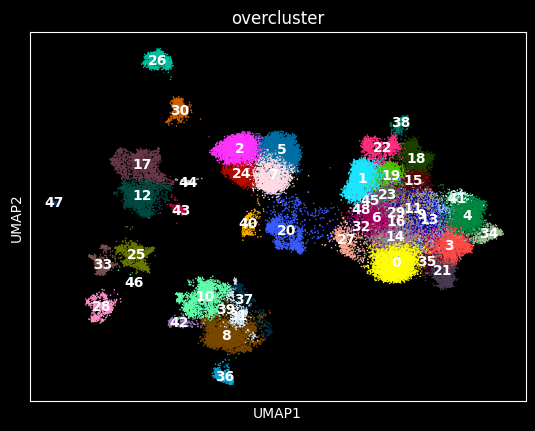

In [17]:
with plt.rc_context({
    'figure.facecolor': 'black',
    'axes.facecolor': 'black', 
    'text.color': 'white',
    'axes.labelcolor': 'white',
    'xtick.color': 'white',
    'ytick.color': 'white',
    'axes.edgecolor': 'white'
}):
    sc.pl.umap(adata, color=['overcluster'], legend_loc='on data', s=5)

In [50]:
#gives which cluster expresses the gene more
marks[(marks.names == 'CD4') ].sort_values('logfoldchanges', ascending = False).head()

,group,names,scores,logfoldchanges,pvals,pvals_adj
636775,44,CD4,7.646035,2.282150,2.414641e-11,7.927715e-11
173780,12,CD4,23.353777,2.238101,1.542060e-104,2.730975e-103
303992,21,CD4,16.929787,1.744493,2.973262e-57,2.877600e-56
108,0,CD4,25.952618,1.642592,1.212907e-137,2.830574e-136
231737,16,CD4,16.654535,1.478679,3.596811e-57,3.690940e-56


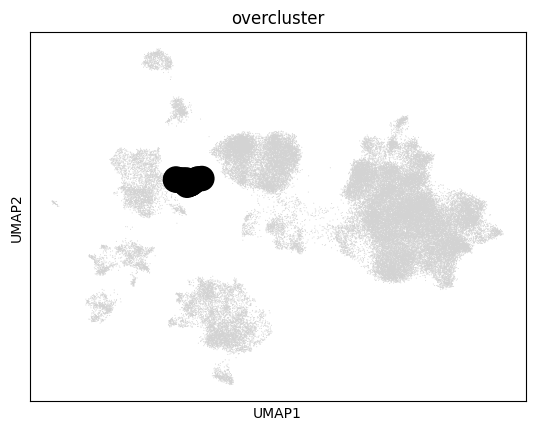

In [11]:
# showing a cluster
ax = sc.pl.umap(adata, palette = 'lightgrey', show = False)
sc.pl.umap(adata[adata.obs.overcluster == '44'], color = 'overcluster', ax = ax, legend_loc = None, palette = 'k')

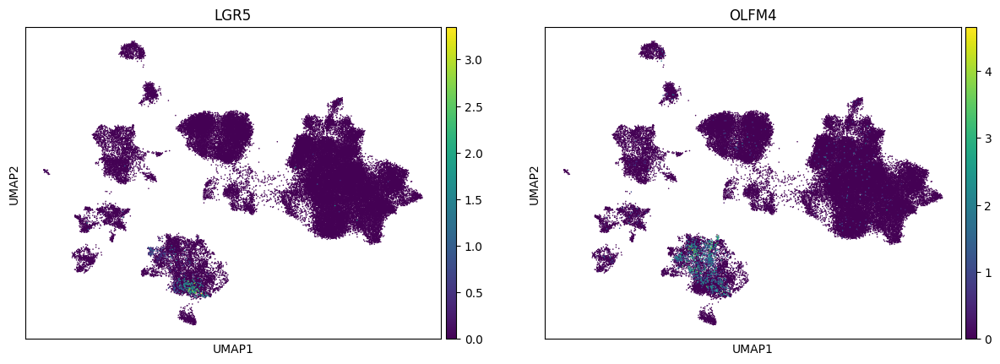

In [31]:
# stem cells 
sc.pl.umap(adata, color = ['LGR5','OLFM4',], legend_loc = 'on data', s = 5)

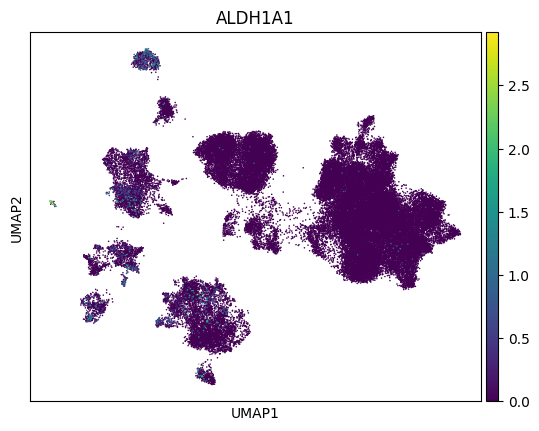

In [34]:
#enteric glial cells
sc.pl.umap(adata, color = ['ALDH1A1',], legend_loc = 'on data', s = 5)

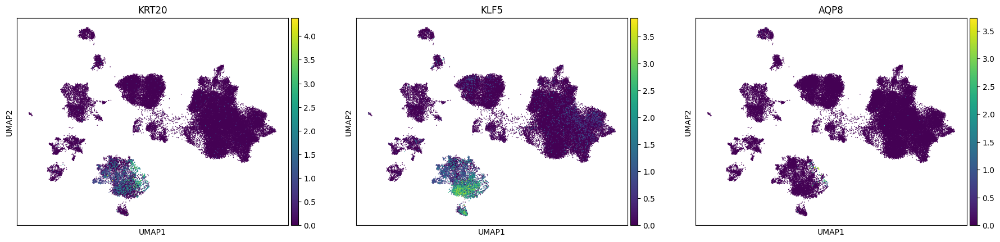

In [37]:
#Colonocytes(enterocytes)
sc.pl.umap(adata, color = ['KRT20','KLF5','AQP8'], legend_loc = 'on data', s = 5)

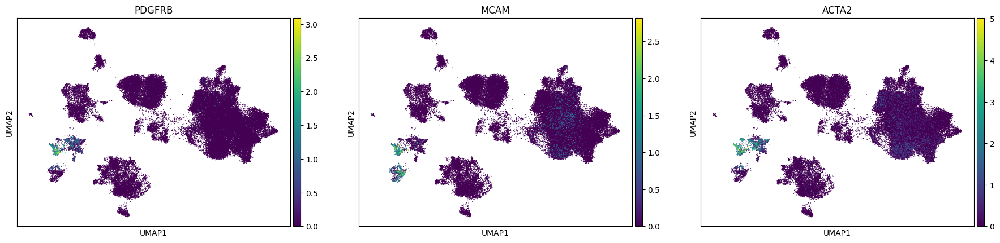

In [21]:
#pericytes
sc.pl.umap(adata, color = ['PDGFRB','MCAM','ACTA2',], legend_loc = 'on data', s = 5)

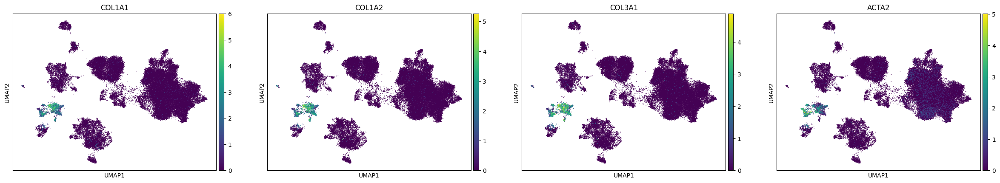

In [29]:
#Cancer-Associated Fibroblasts
sc.pl.umap(adata, color = ['COL1A1','COL1A2','COL3A1','ACTA2'], legend_loc = 'on data', s = 5)

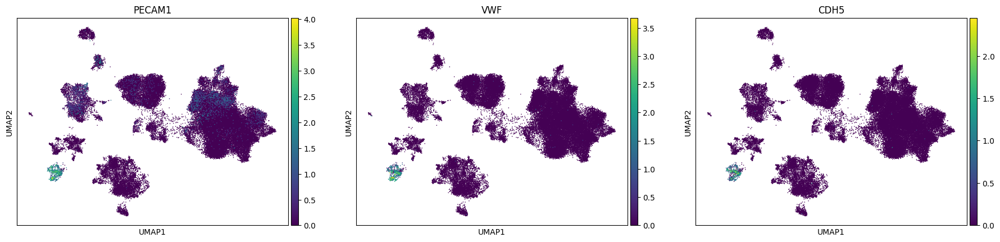

In [30]:
#Endothelial Cells
sc.pl.umap(adata, color = ['PECAM1','VWF','CDH5',], legend_loc = 'on data', s = 5)

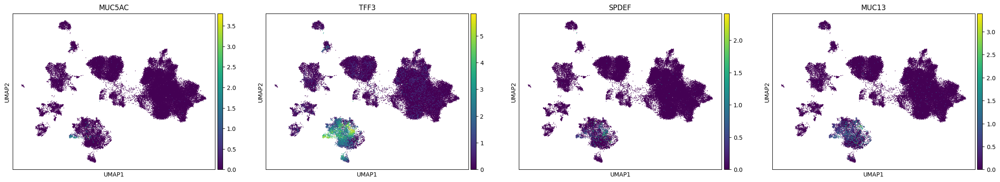

In [28]:
#goblet cells
sc.pl.umap(adata, color = ['MUC5AC','TFF3','SPDEF','MUC13'], legend_loc = 'on data', s = 5)

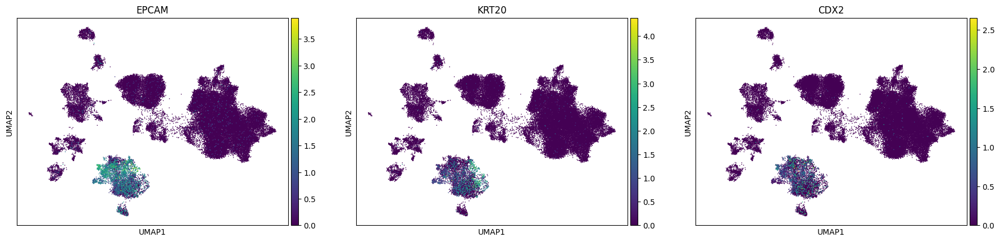

In [14]:
#epithelial cells
sc.pl.umap(adata, color = ['EPCAM','KRT20','CDX2',], legend_loc = 'on data', s = 5)

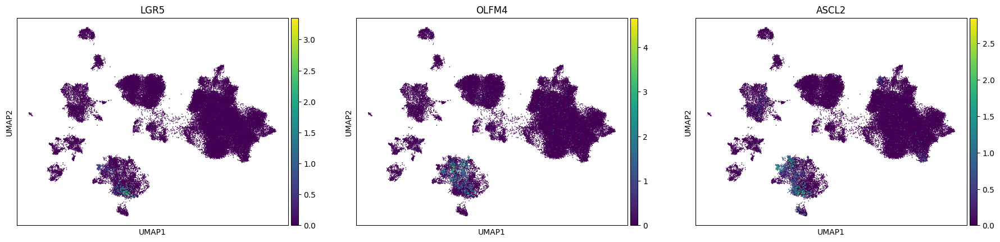

In [15]:
#cancer stem cells
sc.pl.umap(adata, color = ['LGR5','OLFM4','ASCL2',], legend_loc = 'on data', s = 5)

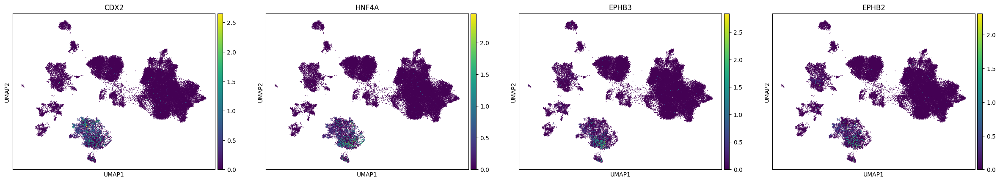

In [20]:
#iCMS2 Subtype (Canonical)
sc.pl.umap(adata, color = ['CDX2','HNF4A','EPHB3','EPHB2',], legend_loc = 'on data', s = 5)

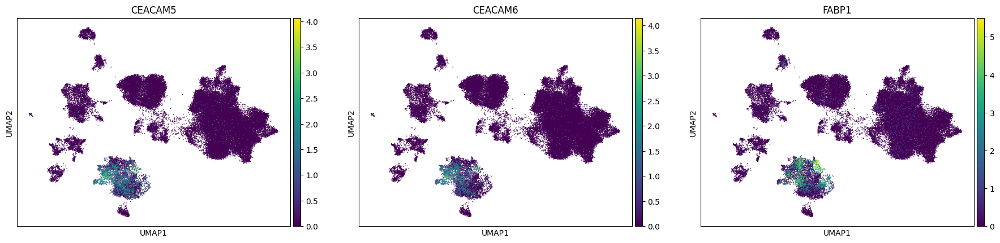

In [22]:
#iCMS3 Subtype (Metabolic)
sc.pl.umap(adata, color = ['CEACAM5','CEACAM6','FABP1',], legend_loc = 'on data', s = 5)

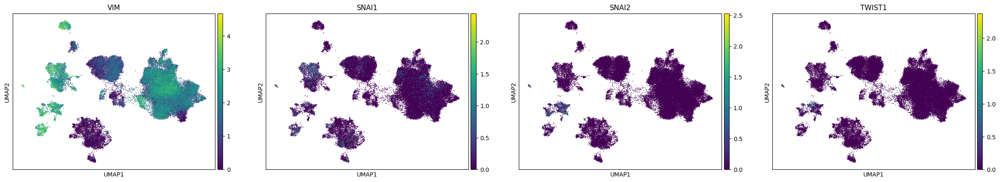

In [23]:
#Invasive/EMT Cancer
sc.pl.umap(adata, color = ['VIM','SNAI1','SNAI2','TWIST1'], legend_loc = 'on data', s = 5)

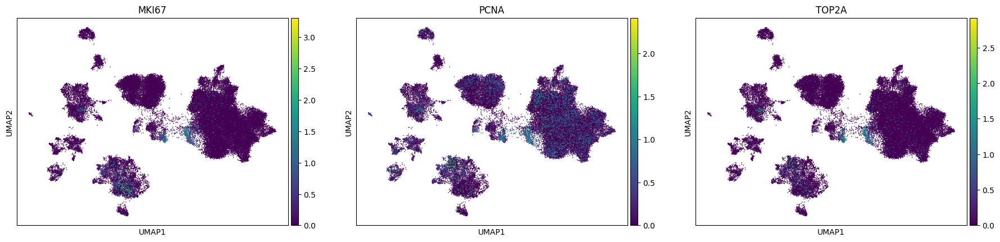

In [24]:
# proliferative cancer
sc.pl.umap(adata, color = ['MKI67','PCNA','TOP2A',], legend_loc = 'on data', s = 5)

immune cells

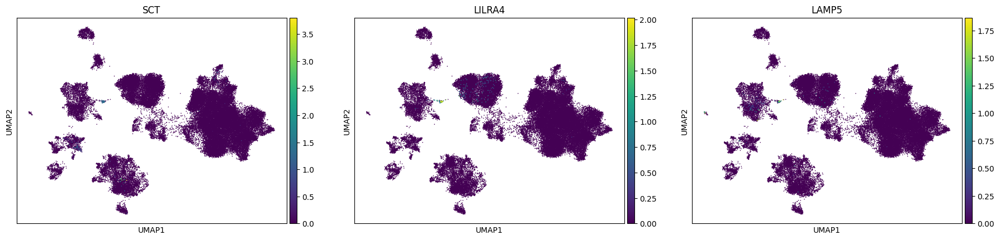

In [15]:
#Plasmacytoid Dendritic Cells (the unknown cluster : 44)
sc.pl.umap(adata, color = ['SCT','LILRA4','LAMP5',], legend_loc = 'on data', s = 5)

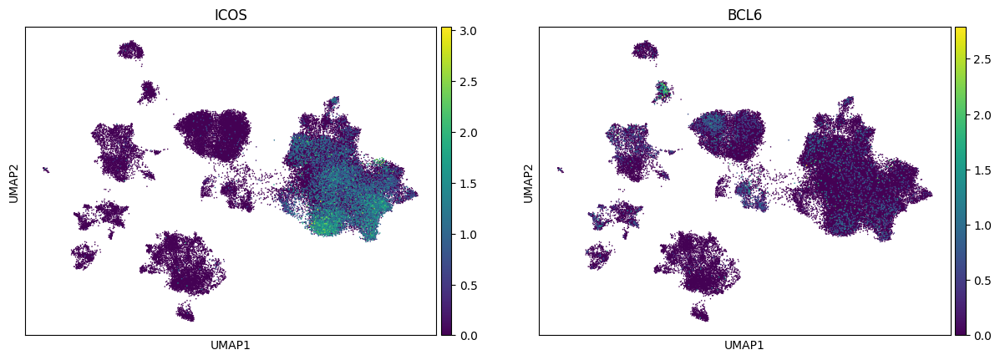

In [48]:
#T follicular helper cells	
sc.pl.umap(adata, color = ['ICOS','BCL6',], legend_loc = 'on data', s = 5)

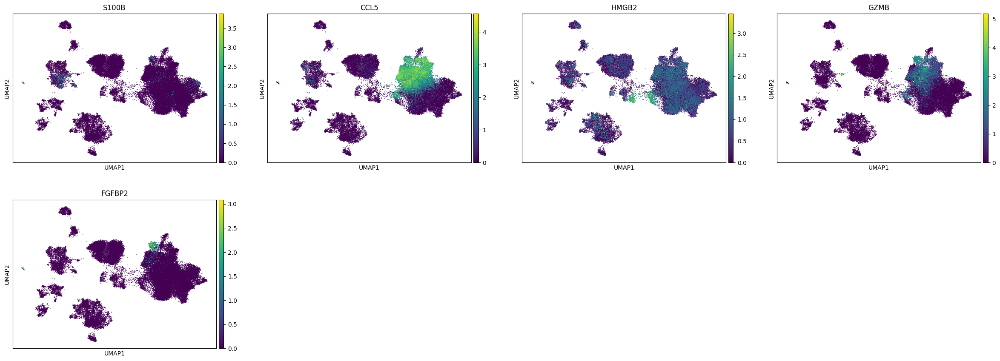

In [47]:
#Gamma Delta T cells
sc.pl.umap(adata, color = ['S100B','CCL5','HMGB2','GZMB','FGFBP2'], legend_loc = 'on data', s = 5)

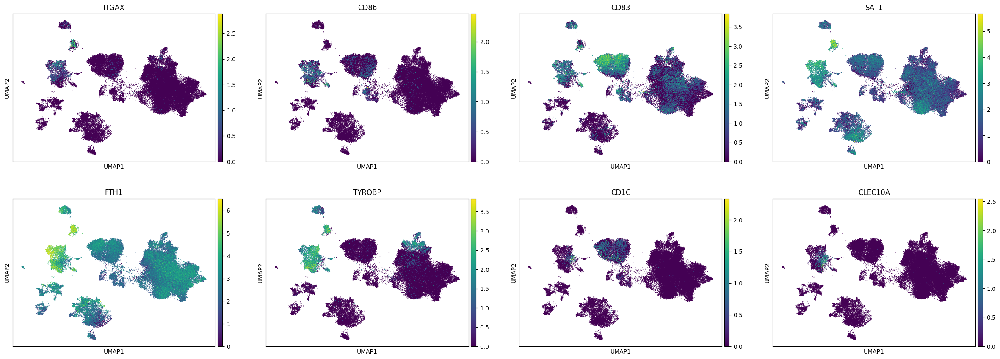

In [58]:
#dentretic cells
sc.pl.umap(adata, color = ['ITGAX','CD86','CD83','SAT1','FTH1','TYROBP','CD1C','CLEC10A',], legend_loc = 'on data', s = 5)

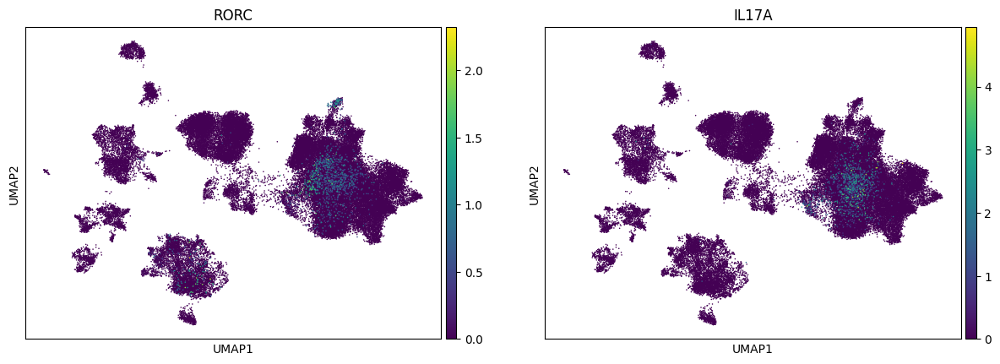

In [35]:
#TH17
sc.pl.umap(adata, color = ['RORC','IL17A',], legend_loc = 'on data', s = 5)

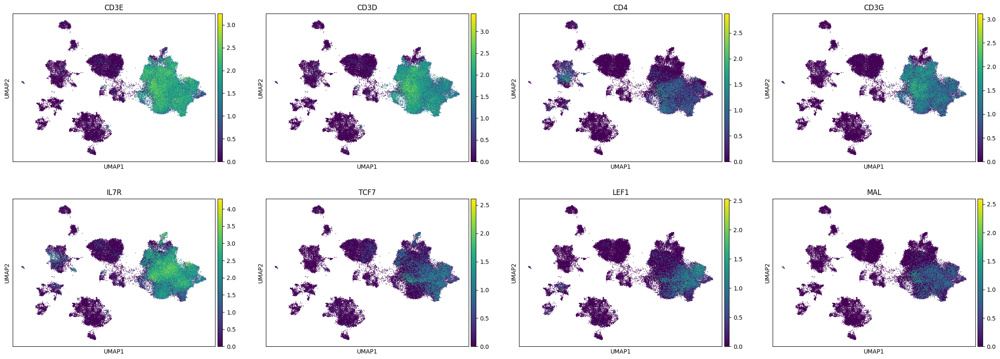

In [35]:
#CD4+ T Helper Cells
sc.pl.umap(adata, color = ['CD3E','CD3D','CD4','CD3G','IL7R','TCF7','LEF1','MAL'], legend_loc = 'on data', s = 5)

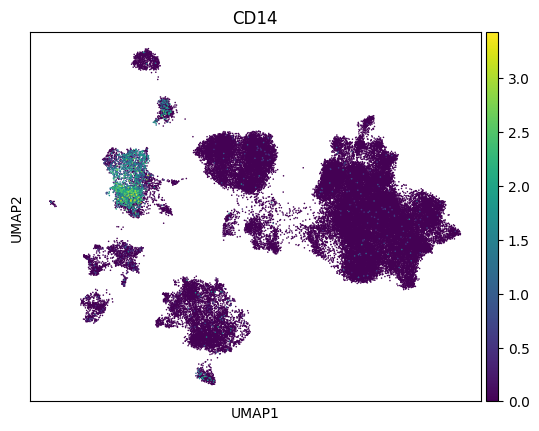

In [27]:
#monocytes
sc.pl.umap(adata, color = ['CD14'], legend_loc = 'on data', s = 5)

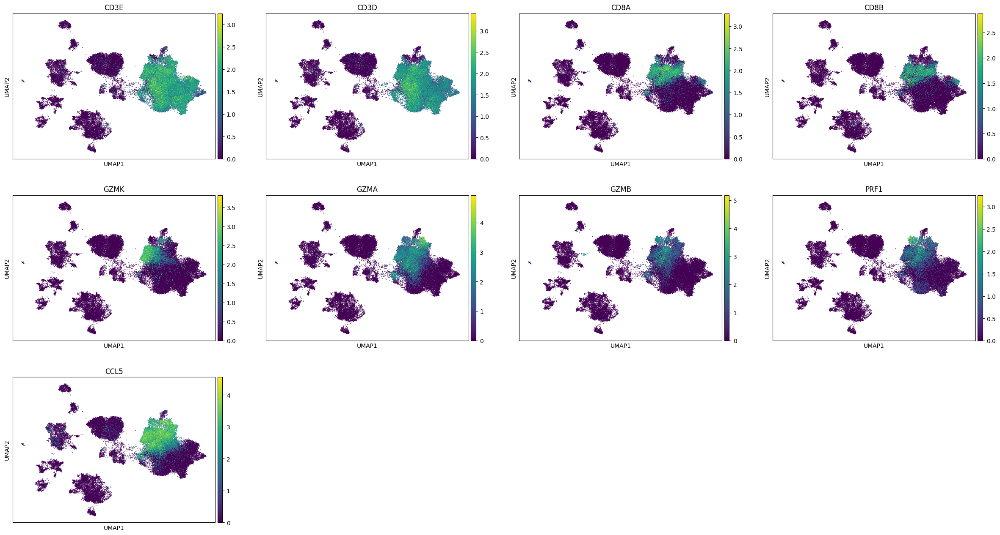

In [22]:
#CD8+ Cytotoxic T Cells
sc.pl.umap(adata, color = ['CD3E','CD3D','CD8A','CD8B','GZMK','GZMA','GZMB','PRF1','CCL5'], legend_loc = 'on data', s = 5)

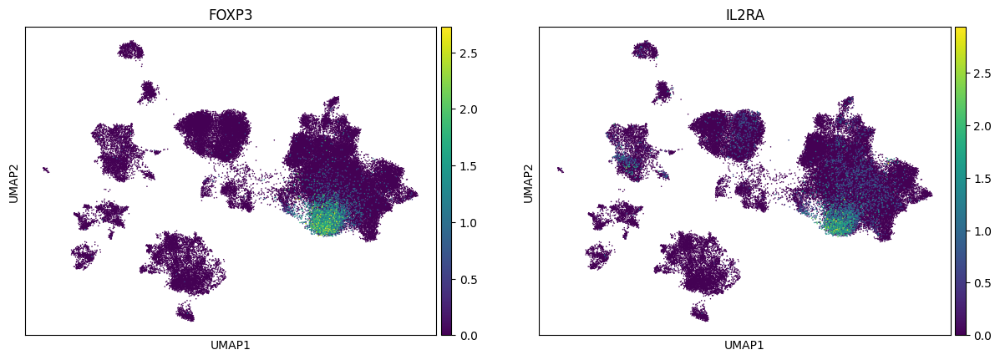

In [25]:
#Tregs
sc.pl.umap(adata, color = ['FOXP3','IL2RA',], legend_loc = 'on data', s = 5)

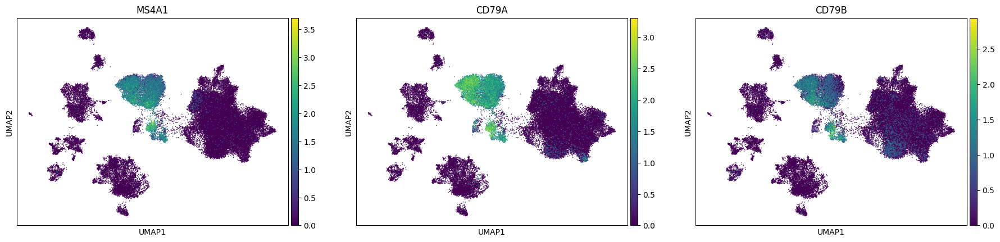

In [27]:
#B-cells
sc.pl.umap(adata, color = ['MS4A1','CD79A','CD79B'], legend_loc = 'on data', s = 5)

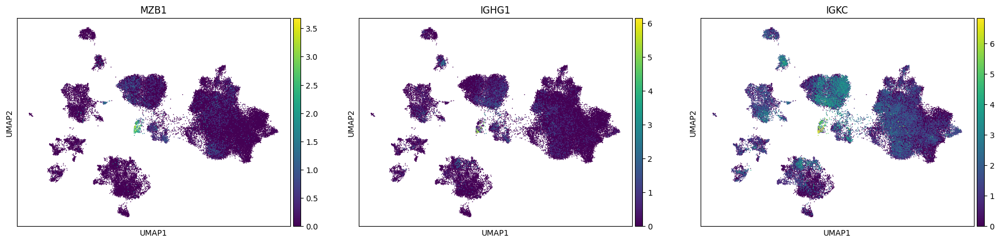

In [29]:
#plasma cells
sc.pl.umap(adata, color = ['MZB1','IGHG1','IGKC'], legend_loc = 'on data', s = 5)

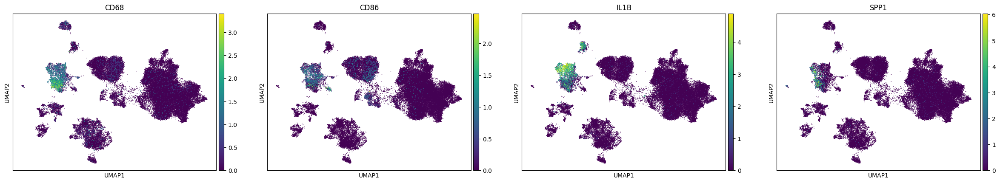

In [33]:
#m1 & m2 macrophages 
sc.pl.umap(adata, color = ['CD68','CD86','IL1B','SPP1'], legend_loc = 'on data', s = 5)

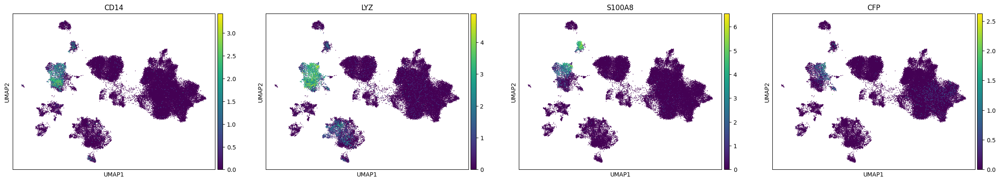

In [35]:
#monocytes 
sc.pl.umap(adata, color = ['CD14','LYZ','S100A8','CFP',], legend_loc = 'on data', s = 5)

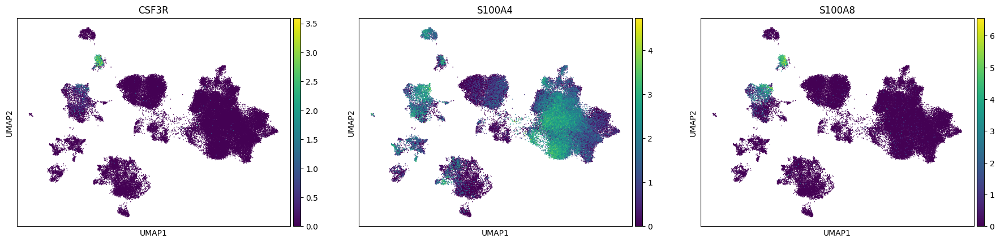

In [63]:
#neutrophils
sc.pl.umap(adata, color = ['CSF3R','S100A4','S100A8'], legend_loc = 'on data', s = 5)

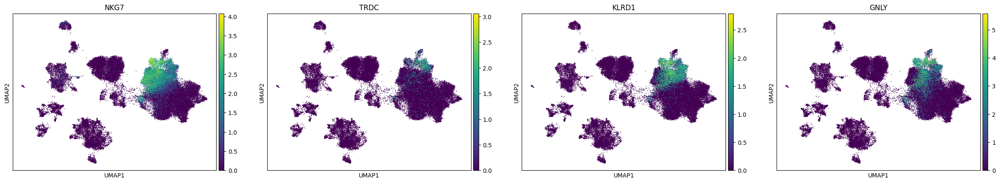

In [42]:
#NK
sc.pl.umap(adata, color = ['NKG7','TRDC','KLRD1','GNLY'], legend_loc = 'on data', s = 5)

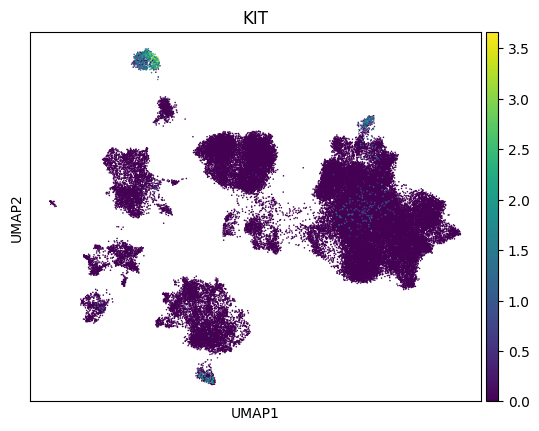

In [43]:
# mast cells
sc.pl.umap(adata, color = ['KIT'], legend_loc = 'on data', s = 5)

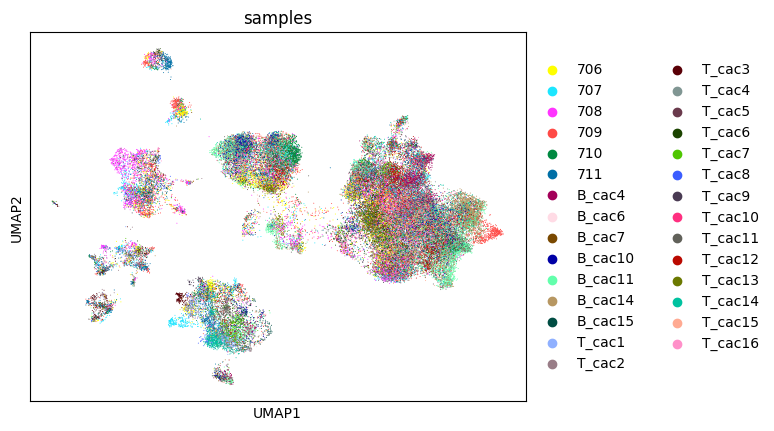

In [13]:
sc.pl.umap(adata[ri,:], color = ['samples'], vmin = .5, size = 2)

In [23]:
adata.write_h5ad('annotated.h5ad')